In [1]:
!pip install tweepy

In [0]:
import tweepy
import pandas as pd
import numpy as np
import sys
import time

In [0]:
API_key = 'x'
API_secret = 'x'
access_token = 'x'
access_token_secret = 'x'

In [0]:
auth = tweepy.OAuthHandler(API_key, API_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth, wait_on_rate_limit=True)

In [0]:
query = 'didi kempot'
max_tweets = 5000
partial_tweet = 500
temp = 0
minid = ""
sincedate = "2020-04-09"
tweets = []
while temp < max_tweets:
  tweetstemp = [status for status in tweepy.Cursor(api.search, lang = "id", q = query, max_id = minid, since = sincedate).items(partial_tweet)]
  listid = [tweet.id for tweet in tweetstemp]
  minid = min(listid)
  tweets = tweets + tweetstemp
  time.sleep(900)
  temp += partial_tweet

In [14]:
tweets

[Status(_api=<tweepy.api.API object at 0x7f0e5cfe3eb8>, _json={'created_at': 'Thu May 14 03:37:09 +0000 2020', 'id': 1260776134725140480, 'id_str': '1260776134725140480', 'text': 'Emang bener deh kalo idup aku dideskripsikan dengan 3 penyanyi/grup ya jawabannya: Day6, SO7, Didi Kempot.', 'truncated': False, 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': []}, 'metadata': {'iso_language_code': 'in', 'result_type': 'recent'}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 3176853300, 'id_str': '3176853300', 'name': 'teru', 'screen_name': 'lenteraanwar_', 'location': '', 'description': 'bravery over beauty.', 'url': None, 'entities': {'description': {'urls': []}}, 'protected': False, 'followers_count': 29, 'friends_count': 35, 'listed_count': 

In [15]:
data = pd.DataFrame()
data['id'] = [tweet.id for tweet in tweets]
data['Created At'] = [tweet.created_at for tweet in tweets]
data['Screen Name'] = [tweet.user.screen_name for tweet in tweets]
data['Tweet'] = [tweet.text for tweet in tweets]
data['Location'] = [str(tweet.user.location) for tweet in tweets]
data['Number of Retweet'] = [tweet.retweet_count for tweet in tweets]
data['Number of Like'] = [tweet.favorite_count for tweet in tweets]
display(data.head(7000))

,id,Created At,Screen Name,Tweet,Location,Number of Retweet,Number of Like
0,1260776134725140480,2020-05-14 03:37:09,lenteraanwar_,Emang bener deh kalo idup aku dideskripsikan d...,,0,0
1,1260775990663372801,2020-05-14 03:36:34,dipurwantto,RT @ChangeOrg_ID: Hanindha membuat petisi agar...,NuswΔntara,1,0
2,1260775521194930177,2020-05-14 03:34:42,ChangeOrg_ID,Hanindha membuat petisi agar @keretaapikita me...,Indonesia,1,2
3,1260775399308443650,2020-05-14 03:34:13,metrotvjateng,Didi Kempot akan dijadikan patung sebagai peng...,"Semarang, Jawa Tengah",1,1
4,1260775075399086080,2020-05-14 03:32:56,vroomvroomafaka,@coromodol @ripcobainn_ Ohh yg Didi Kempot yak...,"Modena, Emilia Romagna",0,0
...,...,...,...,...,...,...,...
4995,1259336640805265409,2020-05-10 04:17:07,latiif_hidayat,RT @dory_harsa: Moment yang tak akan pernah te...,"Sleman, Yogyakarta",194,0
4996,1259336620739670019,2020-05-10 04:17:02,kumparan,Didi Kempot bukan hanya sekadar tembang tapi d...,Jakarta Capital Region,4,21
4997,1259336525013069824,2020-05-10 04:16:39,oanisa07,RT @dory_harsa: Moment yang tak akan pernah te...,,194,0
4998,1259335891610333185,2020-05-10 04:14:08,Ekomaung,6. Hal penting lain adalah keduanya mampu memb...,Ekomaung Institute,4,6


In [0]:
data.to_csv('didi.csv')
data.to_excel('didi.xlsx')

In [0]:
import pandas as pd
import numpy as np
import re
import nltk
import matplotlib.pyplot as plt
%matplotlib inline

In [18]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
dataset = pd.read_csv("didi.csv")

In [20]:
dataset.head(1000)

,Unnamed: 0,id,Created At,Screen Name,Tweet,Location,Number of Retweet,Number of Like
0,0,1260776134725140480,2020-05-14 03:37:09,lenteraanwar_,Emang bener deh kalo idup aku dideskripsikan d...,NaN,0,0
1,1,1260775990663372801,2020-05-14 03:36:34,dipurwantto,RT @ChangeOrg_ID: Hanindha membuat petisi agar...,NuswΔntara,1,0
2,2,1260775521194930177,2020-05-14 03:34:42,ChangeOrg_ID,Hanindha membuat petisi agar @keretaapikita me...,Indonesia,1,2
3,3,1260775399308443650,2020-05-14 03:34:13,metrotvjateng,Didi Kempot akan dijadikan patung sebagai peng...,"Semarang, Jawa Tengah",1,1
4,4,1260775075399086080,2020-05-14 03:32:56,vroomvroomafaka,@coromodol @ripcobainn_ Ohh yg Didi Kempot yak...,"Modena, Emilia Romagna",0,0
...,...,...,...,...,...,...,...,...
995,995,1260259267870748673,2020-05-12 17:23:18,kuatman95,"Nemu lagu ""Teluk Penyu"" ciptaane pakdhe Didi K...",Bogor-Cilacap,0,0
996,996,1260259122286489600,2020-05-12 17:22:43,aumam41,RT @riohanindito: Hari ini Didi Kempot mengaja...,"DKI Jakarta, Indonesia",4000,0
997,997,1260259040308785153,2020-05-12 17:22:24,bucinsilampukau,RT @rsmn_vr: @GabrielleAlixia Kok pada berpras...,sidoarjo,21,0
998,998,1260257629726814210,2020-05-12 17:16:48,permbambungan,"Chords, Didi Kempot – Tanjung Mas Ninggal Janj...",Sleman,0,0


In [0]:
label = dataset['Tweet']

In [22]:
label

0       Emang bener deh kalo idup aku dideskripsikan d...
1       RT @ChangeOrg_ID: Hanindha membuat petisi agar...
2       Hanindha membuat petisi agar @keretaapikita me...
3       Didi Kempot akan dijadikan patung sebagai peng...
4       @coromodol @ripcobainn_ Ohh yg Didi Kempot yak...
                              ...                        
4995    RT @dory_harsa: Moment yang tak akan pernah te...
4996    Didi Kempot bukan hanya sekadar tembang tapi d...
4997    RT @dory_harsa: Moment yang tak akan pernah te...
4998    6. Hal penting lain adalah keduanya mampu memb...
4999    VIRAL TERPOPULER: Yan Vellia Blak-blakan Soal ...
Name: Tweet, Length: 5000, dtype: object

In [0]:
processed_features = []

for sentence in range(0, len(label)):
  processed_feature = re.sub(r'\W', ' ', str(label[sentence]))
  processed_feature = re.sub(r'\s+[a-zA-Z]\s+', ' ', processed_feature)
  processed_feature = re.sub(r'^[a-zA-Z]\s+', '', processed_feature)
  processed_feature = re.sub(r'\s+', ' ', processed_feature, flags=re.I)
  processed_feature = re.sub(r'^b\s+', '', processed_feature)
  processed_feature = processed_feature.lower()
  processed_features.append(processed_feature)

In [24]:
label[:6000]

0       Emang bener deh kalo idup aku dideskripsikan d...
1       RT @ChangeOrg_ID: Hanindha membuat petisi agar...
2       Hanindha membuat petisi agar @keretaapikita me...
3       Didi Kempot akan dijadikan patung sebagai peng...
4       @coromodol @ripcobainn_ Ohh yg Didi Kempot yak...
                              ...                        
4995    RT @dory_harsa: Moment yang tak akan pernah te...
4996    Didi Kempot bukan hanya sekadar tembang tapi d...
4997    RT @dory_harsa: Moment yang tak akan pernah te...
4998    6. Hal penting lain adalah keduanya mampu memb...
4999    VIRAL TERPOPULER: Yan Vellia Blak-blakan Soal ...
Name: Tweet, Length: 5000, dtype: object

In [25]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [26]:
from nltk.corpus import stopwords
stop = nltk.corpus.stopwords.words('indonesian')
label = label.fillna("").apply(lambda x: " ".join(x for x in x.split() if x not in stop))
label.head(6000)

0       Emang bener deh kalo idup dideskripsikan 3 pen...
1       RT @ChangeOrg_ID: Hanindha petisi @keretaapiki...
2       Hanindha petisi @keretaapikita mendirikan memo...
3       Didi Kempot dijadikan patung penghormatan Sura...
4       @coromodol @ripcobainn_ Ohh yg Didi Kempot yak...
                              ...                        
4995    RT @dory_harsa: Moment terlupakan Om Didi Kemp...
4996    Didi Kempot tembang diam-diam pemberi nasihat ...
4997    RT @dory_harsa: Moment terlupakan Om Didi Kemp...
4998    6. Hal membalikkan keadaan..dari persepsi kamp...
4999    VIRAL TERPOPULER: Yan Vellia Blak-blakan Soal ...
Name: Tweet, Length: 5000, dtype: object

In [27]:
label = label.str.replace('[^\w\s]', '')
label.head(6000)

0       Emang bener deh kalo idup dideskripsikan 3 pen...
1       RT ChangeOrg_ID Hanindha petisi keretaapikita ...
2       Hanindha petisi keretaapikita mendirikan memor...
3       Didi Kempot dijadikan patung penghormatan Sura...
4       coromodol ripcobainn_ Ohh yg Didi Kempot yak S...
                              ...                        
4995    RT dory_harsa Moment terlupakan Om Didi Kempot...
4996    Didi Kempot tembang diamdiam pemberi nasihat k...
4997    RT dory_harsa Moment terlupakan Om Didi Kempot...
4998    6 Hal membalikkan keadaandari persepsi kampung...
4999    VIRAL TERPOPULER Yan Vellia Blakblakan Soal Pe...
Name: Tweet, Length: 5000, dtype: object

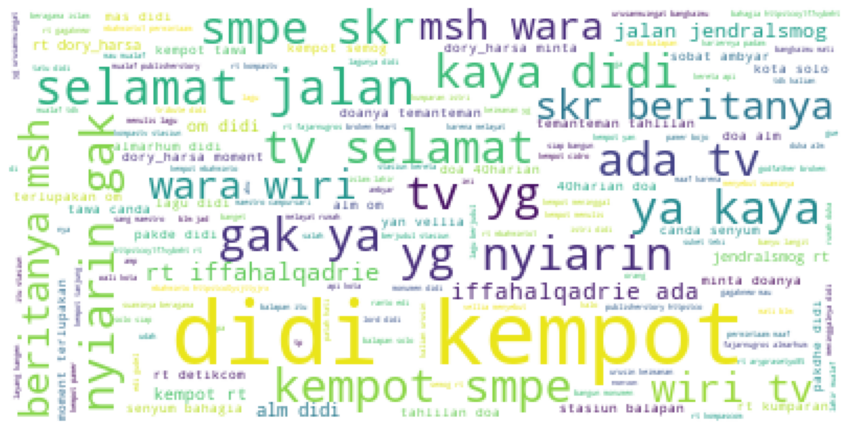

In [28]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
word_string = " ".join(label.str.lower())
wordcloud = WordCloud(stopwords = STOPWORDS, background_color = 'white',).generate(word_string)

plt.figure(figsize=(15, 10))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [0]:
label = dataset['Location']

In [30]:
label

0                          NaN
1                   NuswΔntara
2                    Indonesia
3        Semarang, Jawa Tengah
4       Modena, Emilia Romagna
                 ...          
4995        Sleman, Yogyakarta
4996    Jakarta Capital Region
4997                       NaN
4998        Ekomaung Institute
4999      Surabaya, Jawa Timur
Name: Location, Length: 5000, dtype: object

In [0]:
processed_features = []

for sentence in range(0, len(label)):
  processed_feature = re.sub(r'\W', ' ', str(label[sentence]))
  processed_feature = re.sub(r'\s+[a-zA-Z]\s+', ' ', processed_feature)
  processed_feature = re.sub(r'^[a-zA-Z]\s+', '', processed_feature)
  processed_feature = re.sub(r'\s+', ' ', processed_feature, flags=re.I)
  processed_feature = re.sub(r'^b\s+', '', processed_feature)
  processed_feature = processed_feature.lower()
  processed_features.append(processed_feature)

In [32]:
from nltk.corpus import stopwords
stop = nltk.corpus.stopwords.words('indonesian')
label = label.fillna("").apply(lambda x: " ".join(x for x in x.split() if x not in stop))
label.head(6000)

0                             
1                   NuswΔntara
2                    Indonesia
3        Semarang, Jawa Tengah
4       Modena, Emilia Romagna
                 ...          
4995        Sleman, Yogyakarta
4996    Jakarta Capital Region
4997                          
4998        Ekomaung Institute
4999      Surabaya, Jawa Timur
Name: Location, Length: 5000, dtype: object

In [33]:
label = label.str.replace('[^\w\s]', '')
label.head(6000)

0                             
1                   NuswΔntara
2                    Indonesia
3         Semarang Jawa Tengah
4        Modena Emilia Romagna
                 ...          
4995         Sleman Yogyakarta
4996    Jakarta Capital Region
4997                          
4998        Ekomaung Institute
4999       Surabaya Jawa Timur
Name: Location, Length: 5000, dtype: object

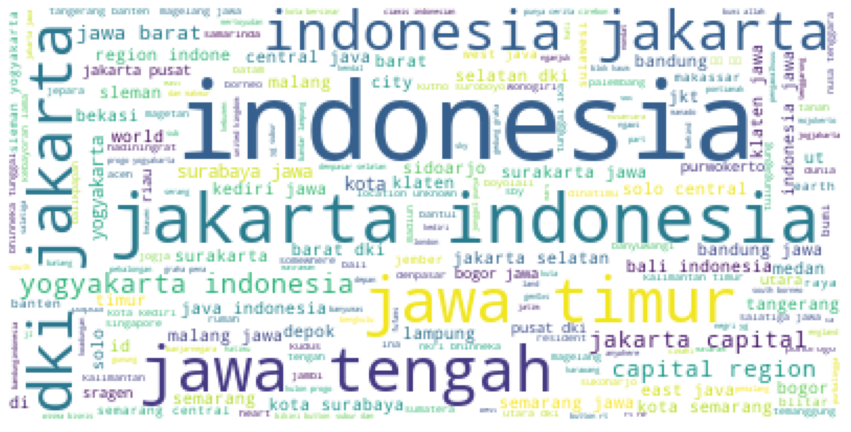

In [34]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
word_string = " ".join(label.str.lower())
wordcloud = WordCloud(stopwords = STOPWORDS, background_color = 'white',).generate(word_string)

plt.figure(figsize=(15, 10))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()